## Stats 131 Final Project

##### Predicting House Prices in King County, USA

__By Group:__ We Push to Master

__Group members:__ Minsu Jeon, Junyan Zheng, Jaspreet Kang, Melissa Duffus

## Why we chose the Data:
As graduating seniors, we have all been thinking about our futures, such as jobs, building a family and most importantly purchasing a home. Something that is important to do when buying a home is analyze which is the best fit for us, specifically, the price of it. To help us learn about the variables that determine the price of a house we decided to look for housing data in Kaggle. Although we wanted to find a dataset that was closest to this year by time period, the closest and most interesting dataset we found was House Sales in King County. The Data is a set of houses sold in between May 2014 and May 2015 in King County, Washington.

The reason we found this data set interesting is due the fact that the most popular city in King County, Seattle, has been a fast growing city in the past couple of years, specifically for tech companies. As statistics majors and our interest in technology, Seattle is a top choice for seeking future employment and a future home. The increase in technology not only has opened opportunities for more jobs, we believe it has also affected the price of homes in Seattle and nearby city in King County, Washington.

## Common Knowledge:
It is understandable and most common for a person to think the more bedrooms and the more bathrooms a home has the more it will cost. However, it is not the only factor in increasing the price value for a house. The appearance of the neighborhood will also have an affect on the house.

## Other Research:
Yulia Norenko, Howard Chang, Lavanya Gupta and Silvia Lu similarly used machine learning algorithms to predict the prices of houses. They used a different data set, however some of the variables in their dataset are similar to the variables in our dataset. Some of the more important variables they found in predicting house prices were "Above Grade Living Area Square feet", "Overall Condition", and "the Neighborhoods".

### The link to the data we used: https://www.kaggle.com/harlfoxem/housesalesprediction
#### Variable Explanation:

-__Id:__ A number used to indentify the houses in the data set. 

-__Date:__ The Date the house was sold. Represented by YearMonthDayTime, where T and the time was not captured, but entered as 0s. 

-__Price:__ The Price is the prediciton target, or the price the house was sold for. The observational unit is in dollars. 

-__Bedrooms:__ The number of bedrooms in the house. 

-__Bathrooms:__ The unit is an decimal, representing the number of bathrooms in the house, where 1/2 would mean a smaller than normal restroom with no shower. 

-__Sqft_living:__ The unit is an integer, representing the size in square footage of the home. 

-__Sqft_lot:__ The unit is an integer, representing the size in square footage of the lot. 

-__Floors:__ The total number of floors or levels in house. 

-__Waterfront:__ The observational unit is an dummy variable of 0 or 1, where 1 represents the house which has a view to a waterfront, and 0 represents a house without a view to a waterfront. 

-__View:__ The observational unit is an integer ranging from 0 to 5, representing the number of times the house has been viewed. 

-__Condition:__ The observational unit is an integer ranging from 1 to 5, representing how good the condition is of the house is overall.

-__Grade:__ The observational unit is an integer, representing the overall grade given to the housing unit, based on King County grading system.

-__Sqft_above:__ The size in square footage of house apart from basement.

-__Sqft_basement:__ The size in square footage of the basement.

-__Yr_built:__ The year the home was built. 

-__Yr_renovated:__ The year when house was renovated. 

-__Zipcode:__ The zip code the house is located in. 

-__Lat:__ Latitude coordinate of the house. 

-__Long:__ Longitude coordinate of the house. 

-__Sqft_living15:__ The size of the living room area in 2015 which implies there have been some renovations. This might or might not have affected the lotsize area 

-__Sqft_lot15:__ The size of the lot area in 2015, this implies some renovations.

### Add a new variable
-__city:__ Transfer zip code to city.

In [74]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn import linear_model
import sklearn.metrics as sm
from sklearn import ensemble
from sklearn.model_selection import cross_val_score

### Read the data.

In [2]:
kc = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis:
First we take a quick look at the data to see if there are any missing values, that all variables are formatted correctly or if any changes need to be made to clean up the data.

In [3]:
kc.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
kc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
id               21613 non-null int64
date             21613 non-null object
price            21613 non-null float64
bedrooms         21613 non-null int64
bathrooms        21613 non-null float64
sqft_living      21613 non-null int64
sqft_lot         21613 non-null int64
floors           21613 non-null float64
waterfront       21613 non-null int64
view             21613 non-null int64
condition        21613 non-null int64
grade            21613 non-null int64
sqft_above       21613 non-null int64
sqft_basement    21613 non-null int64
yr_built         21613 non-null int64
yr_renovated     21613 non-null int64
zipcode          21613 non-null int64
lat              21613 non-null float64
long             21613 non-null float64
sqft_living15    21613 non-null int64
sqft_lot15       21613 non-null int64
dtypes: float64(5), int64(15), object(1)
memory usage: 3.5+ MB


We have checked that there are no missing values and all variables are in the correct type. Since the date is not written properly, we went ahead and changed the format.

In [5]:
kc.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [6]:
kc = kc.drop(["id", "date"], axis=1)
kc.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [7]:
print(kc.shape)

(21613, 19)


We can see that our dataset has 21613 observations of houses and 19 columns or variables that describe these houses.

### Basic Summary Statistics:

In [8]:
kc.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


We noticed that the max number of bedrooms in a house was 33 and max number of bathrooms in a house is 8 which seem a bit off, we will do some further investigation to determine if there are potential outliers.

In [9]:
kc[kc.bedrooms==33]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15870,640000.0,33,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700


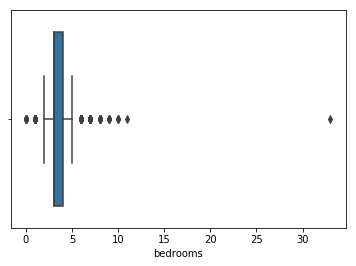

In [10]:
sns.boxplot(kc.bedrooms, data=kc)

In [11]:
kc[kc.bathrooms==8]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7252,7700000.0,6,8.0,12050,27600,2.5,0,3,4,13,8570,3480,1910,1987,98102,47.6298,-122.323,3940,8800
12777,2280000.0,7,8.0,13540,307752,3.0,0,4,3,12,9410,4130,1999,0,98053,47.6675,-121.986,4850,217800


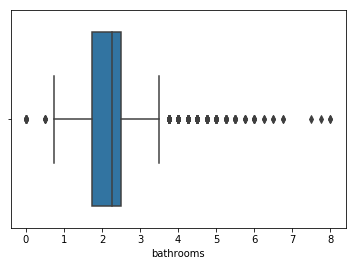

In [12]:
sns.boxplot(kc.bathrooms, data=kc)

We did some further investigation by finding the data points and looking into the other variables to determine if these results are reasonable. For the observation of 33 bedrooms, since the price for the home is not over a million and the number of restrooms for the home is 1.75 we believed it was an outlier or a typo. After doing a boxplot of the number of bedrooms we found that it is indeed an outlier. For the houses with 8 bathrooms we found that they had an almost similar amount of bedrooms and after doing a boxplot for the number of bathrooms we found they are not outliers.

### Add variable "city"

In [13]:
from uszipcode import SearchEngine
import re
city = [1]*len(kc)
for i in range(len(kc)):
    search = SearchEngine(simple_zipcode=True) # set simple_zipcode=False to use rich info database
    zipcode = search.by_zipcode(int(kc.ix[i,14]))
    result = re.search("major_city='(.*)', post_", str(zipcode))
    city[i] = result.group(1)
kc['city'] = city

C:\Users\pooki\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


In [16]:
display(kc.head())
print(kc.shape)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,city
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,Seattle
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,Seattle
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,Kenmore
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,Seattle
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,Sammamish


(21613, 20)


After adding the variable "city", we now have 20 variables.

### Correlation Matrix

<function matplotlib.pyplot.show(*args, **kw)>

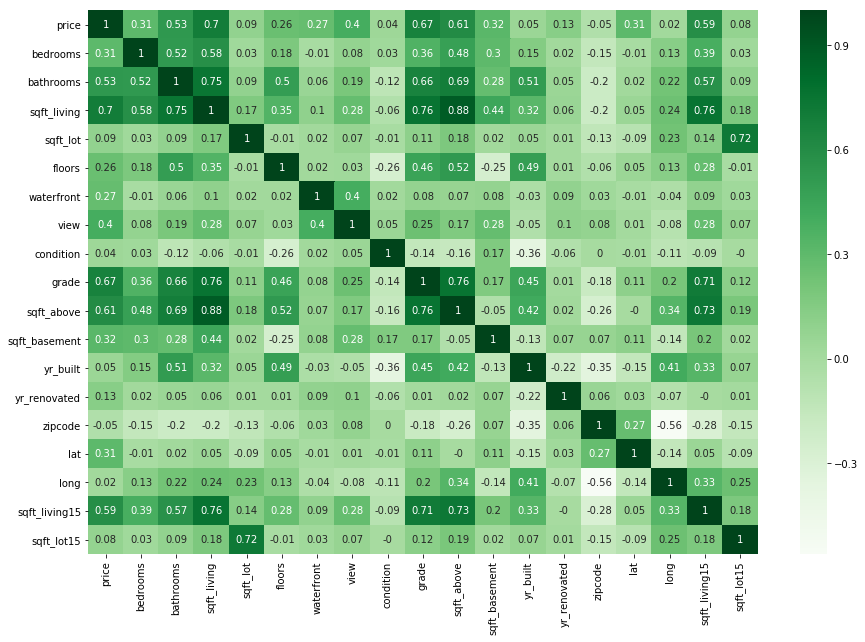

In [18]:
corr = round(kc.corr(), 2)
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot = True, xticklabels=corr.columns.values, yticklabels=corr.columns.values, cmap="Greens")
plt.show

Sqft_living (0.70), Grade (0.67), Sqft_Above(0.61), and Sqft_living15 are the highest correlated predictors with Price. Surprisingly, the variable bedrooms has a relatively weak correlation (0.31) with Price, while bathrooms is correlated (0.53) higher with Price. 

### Histogram

Text(0, 0.5, 'Houses')

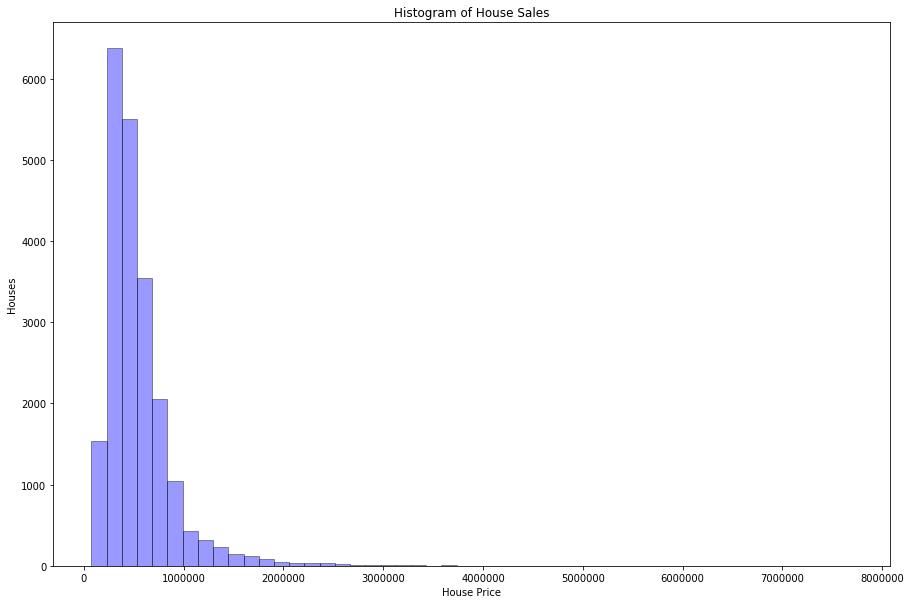

In [19]:
plt.figure(figsize=(15,10))
sns.distplot(kc['price'], hist=True, kde=False, 
             color = 'blue',
             hist_kws={'edgecolor':'black'})
# Add labels
plt.title('Histogram of House Sales')
plt.xlabel('House Price')
plt.ylabel('Houses')

The histogram of House Prices displays a skewed distribution to the right. To correct this, we take the log of House Prices.

Text(0, 0.5, 'Houses')

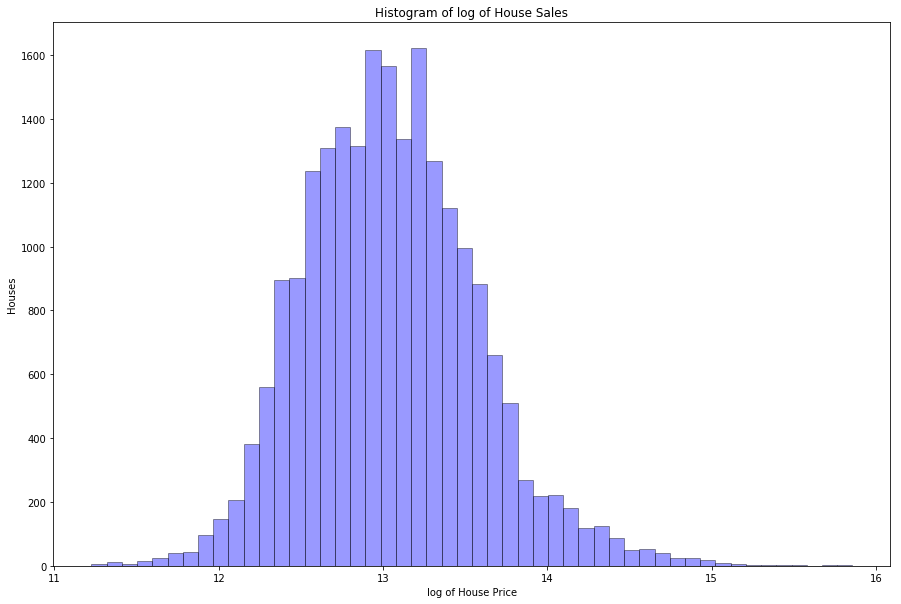

In [22]:
plt.figure(figsize=(15,10))
sns.distplot(np.log(kc['price']), hist=True, kde=False, 
             color = 'blue',
             hist_kws={'edgecolor':'black'})
# Add labels
plt.title('Histogram of log of House Sales')
plt.xlabel('log of House Price')
plt.ylabel('Houses')

### Scatter Plot Matrix with the following variables: bathrooms, bedrooms, price, grade, sqft_living

C:\Users\pooki\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)
C:\Users\pooki\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\pooki\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\pooki\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\pooki\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


<Figure size 1080x720 with 0 Axes>

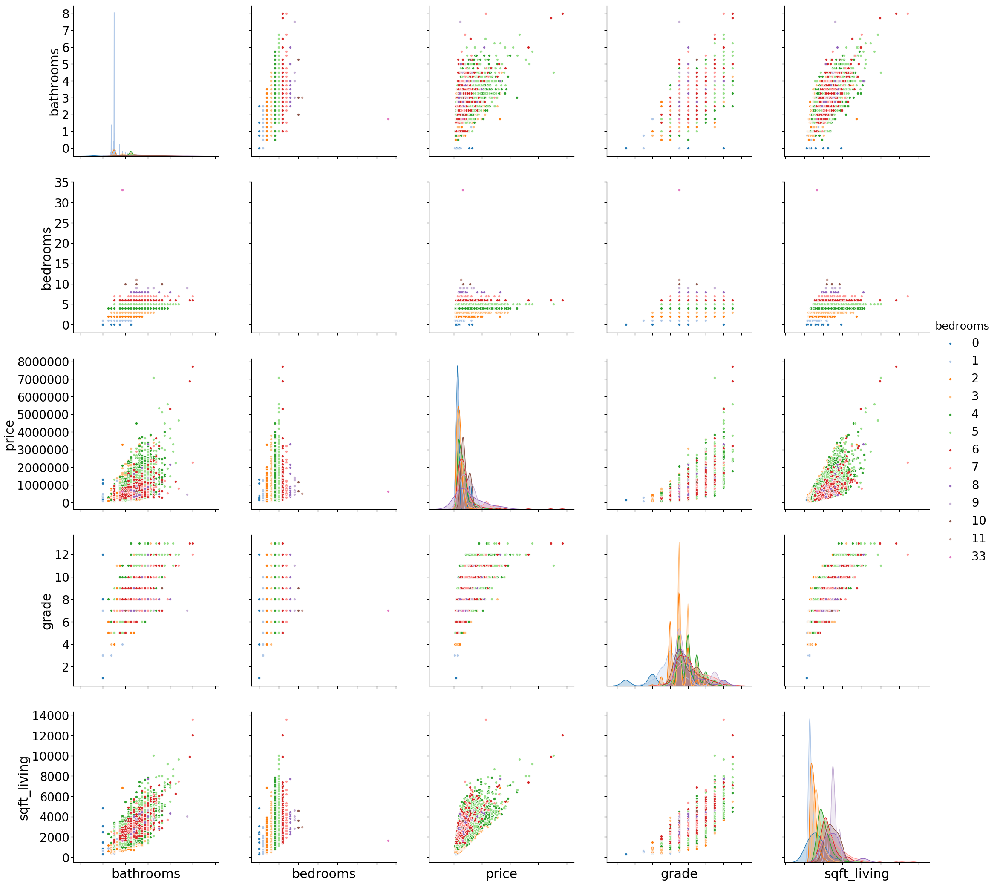

In [23]:
plt.figure(figsize=(15,10))
with sns.plotting_context("notebook", font_scale=2.5):
    g = sns.pairplot(kc[['bathrooms', 'bedrooms', 'price', 'grade', 'sqft_living']], hue='bedrooms', palette='tab20', size=6)
g.set(xticklabels=[])

Looking at the relationship of each of these predictors to Price, we see a stronger positive linear relationship with Sqft_living and Grade. A weaker positive linear relationship is shown with both bathrooms and bedrooms vs Price. Furthermore, relationships between predictors are explored. Sqft_living and bathrooms show the strongest positive linear relationship.

When checking the correlation matrix constructed previously, many of the Sqft related predictors (such as sqft_living versus sqft_above (0.88)) had a high positive correlation value. This can present a multicollinearity issue.

Moving on, we take a closer look at some of the individual relationships between Price and some of the more important predictors.

Text(0.5, 1.0, 'Bedrooms vs Log Price')

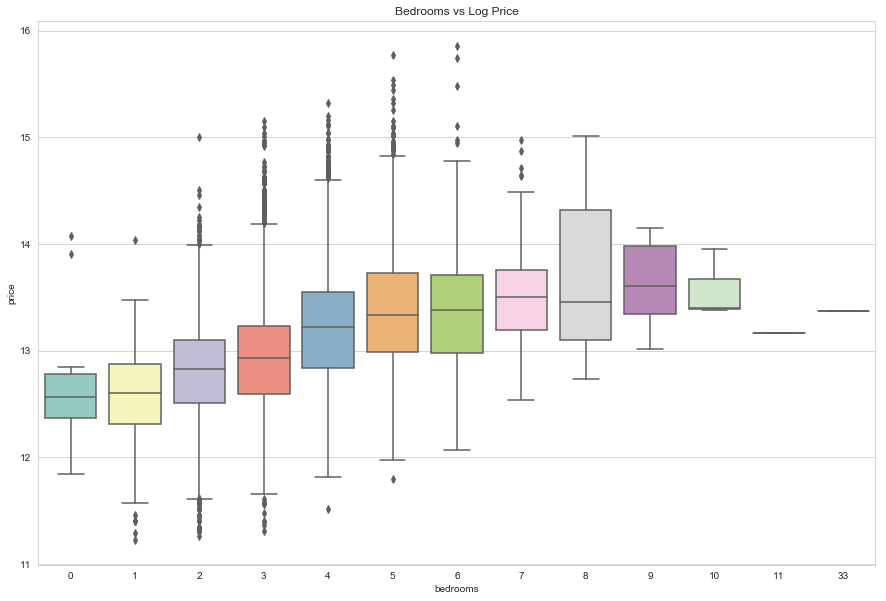

In [25]:
plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.boxplot(x="bedrooms", y=np.log(kc.price), data=kc, palette="Set3")
plt.title("Bedrooms vs Log Price")

There a slight upward trend in House Prices as Bedrooms go up. Furthermore, the variability in house prices is higher in 2-6 bedrooms is higher than in 0-1 and 7-11 bedroom houses. With the higher variability, more outliers exist

Text(0.5, 1.0, 'Bathrooms vs Log Price')

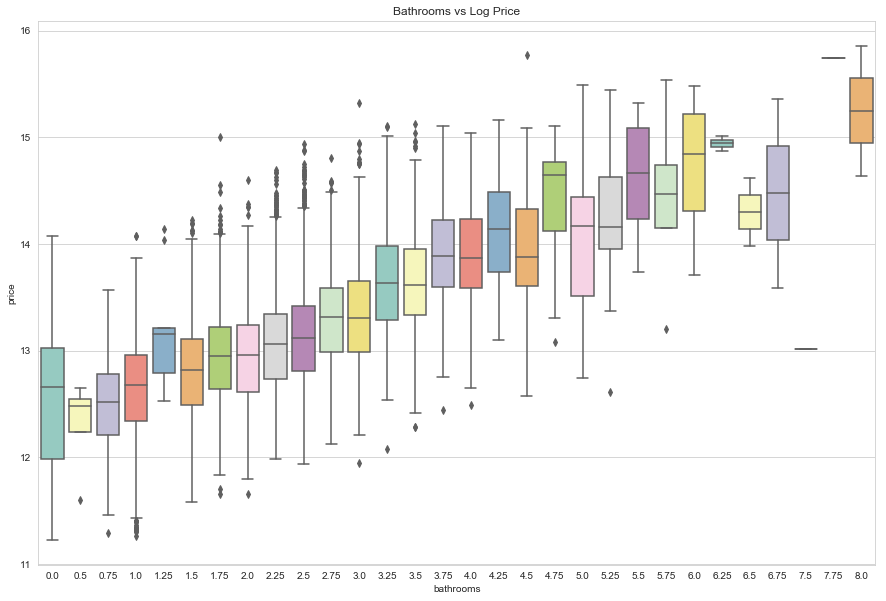

In [27]:
plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.boxplot(x="bathrooms", y=np.log(kc.price), data=kc, palette="Set3")
plt.title("Bathrooms vs Log Price")

Generally, as number of bathrooms increase, the House Prices increase.

Text(0.5, 1.0, 'Grade vs Log Price')

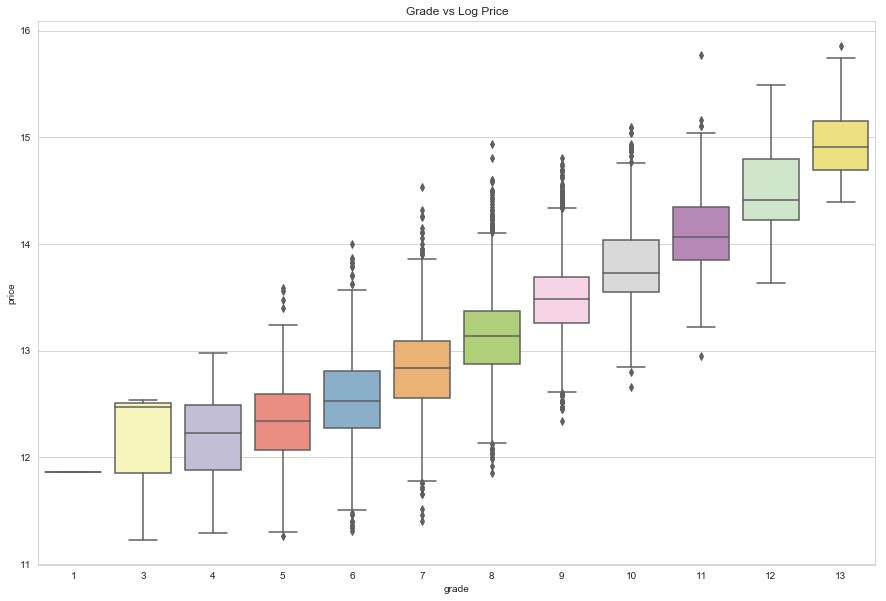

In [28]:
plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.boxplot(x="grade", y=np.log(kc.price), data=kc, palette="Set3")
plt.title("Grade vs Log Price")

With the exception of Grade 3 to Grade 4, as Grade of the House goes up, the House Price goes up. Compared to the previous predictors (Bedrooms and Bathrooms), the positive linear relationship is more apparent here.

Text(0, 0.5, 'log of price')

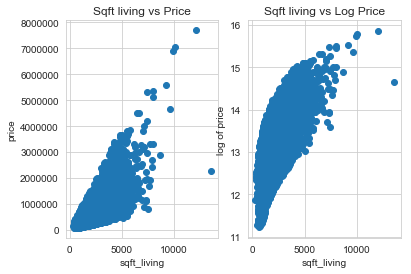

In [94]:
plt.subplot(1, 2, 1)
plt.scatter(kc.sqft_living, kc.price)
plt.title("Sqft living vs Price")
plt.xlabel("sqft_living")
plt.ylabel("price")
plt.subplot(1, 2, 2)
plt.scatter(kc.sqft_living, np.log(kc.price))
plt.title("Sqft living vs Log Price")
plt.xlabel("sqft_living")
plt.ylabel("log of price")

A positive relationship is shown between House Price and Sqft living.

In [31]:
jpgfile1 = Image.open("King County w Houses as Points.jpeg")
jpgfile2 = Image.open("King county bedrooms.jpeg")
jpgfile3 = Image.open("Average price by City.jpeg")

In [32]:
print("There are ", kc.zipcode.nunique(), "unique zip codes.")
print("There are ", kc['city'].nunique(), "unique cities")

There are  70 unique zip codes.
There are  24 unique cities


### Map of Houses in King County

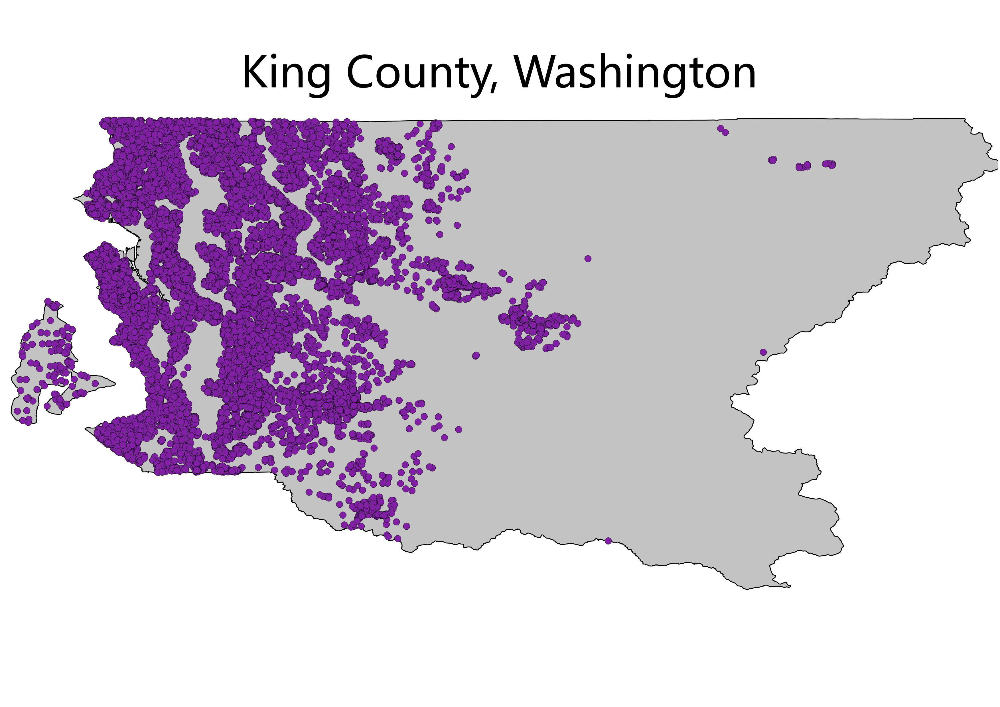

In [33]:
jpgfile1

### Map of average number of bedrooms by city

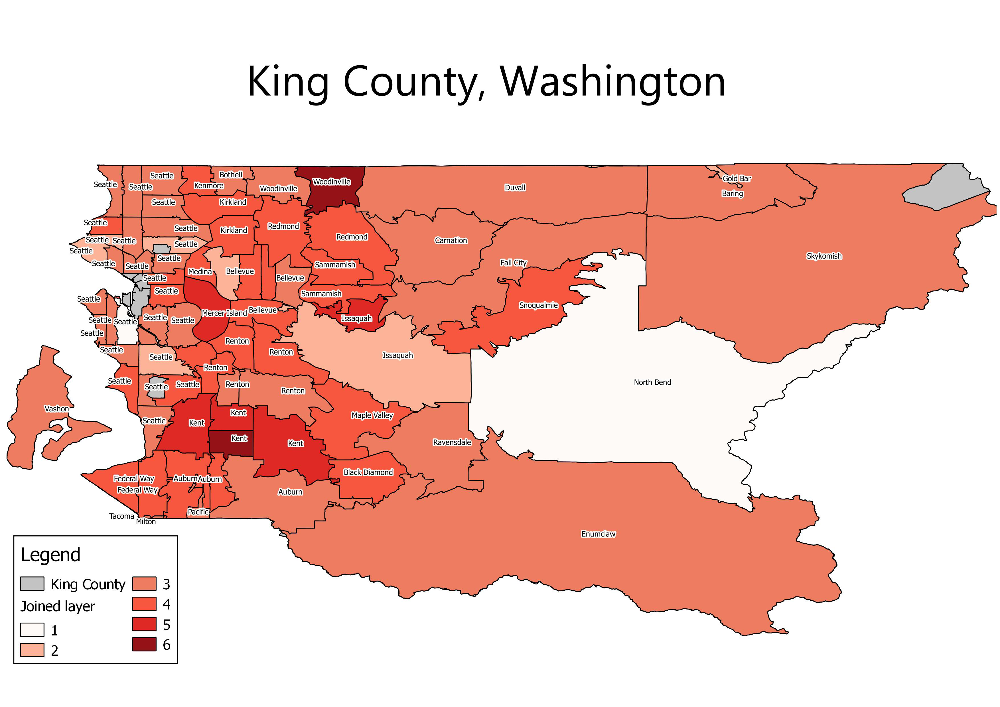

In [34]:
jpgfile2

Cities such as Kent, Issaquah, Mercer, and Woodinville have houses with a higher average of bedrooms. The many different parts of Seattle have a variety of average number of bedroom houses.

### Map of average house prices by city

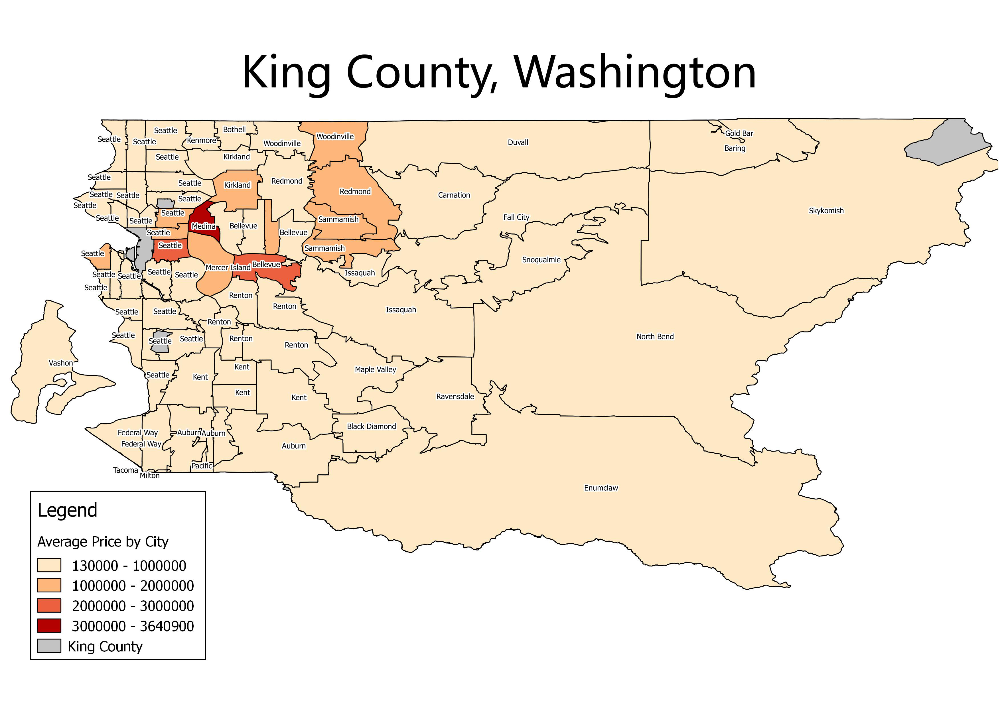

In [35]:
jpgfile3

This map serves the purpose of showing which cities in King County are the most expensive. Medina comes out the most expensive. Additionally, south side of Bellevue and certain parts of Seattle (which all neighbor each other) also comes out with average house prices of over $1 million.

Table below orders the cities from the cheapest median House Sale Prices to the most expensive.

In [41]:
df1 = kc.groupby("city").count()
df2 = kc.groupby("city").median()
df2.sort_values(by='price')

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
city,,,,,,,,,,,,,,,,,,,
Federal Way,268000.0,3.0,2.25,1850.0,8580.0,1.0,0.0,0.0,3.0,7.0,1500.0,0.0,1978.0,0.0,98023.0,47.31120,-122.3480,1870.0,8400.0
Auburn,270000.0,3.0,2.25,1880.0,8352.5,1.0,0.0,0.0,3.0,7.0,1680.0,0.0,1985.0,0.0,98002.0,47.30980,-122.2170,1780.0,8004.0
Enumclaw,279500.0,3.0,2.00,1670.0,10213.5,1.0,0.0,0.0,4.0,7.0,1600.0,0.0,1980.0,0.0,98022.0,47.20610,-121.9990,1685.0,9317.0
Kent,283200.0,3.0,2.25,1860.0,8035.0,1.0,0.0,0.0,3.0,7.0,1650.0,0.0,1984.0,0.0,98032.0,47.37370,-122.1700,1860.0,7800.0
Maple Valley,342000.0,3.0,2.50,2000.0,6904.5,2.0,0.0,0.0,3.0,7.0,1945.0,0.0,2000.0,0.0,98038.0,47.36405,-122.0330,2020.0,6719.0
Renton,358000.0,3.0,2.25,1990.0,8116.0,1.0,0.0,0.0,3.0,7.0,1720.0,0.0,1979.0,0.0,98058.0,47.48020,-122.1660,1940.0,8046.0
Black Diamond,359999.5,3.0,2.00,1902.0,19727.0,1.5,0.0,0.0,3.0,7.0,1680.0,0.0,1988.5,0.0,98010.0,47.33525,-122.0030,1860.0,18963.0
North Bend,399500.0,3.0,2.25,1830.0,12566.0,1.5,0.0,0.0,3.0,7.0,1740.0,0.0,1989.0,0.0,98045.0,47.47760,-121.7690,1680.0,11560.0
Duvall,401250.0,3.0,2.50,2110.0,10515.5,2.0,0.0,0.0,3.0,7.0,1925.0,0.0,1997.0,0.0,98019.0,47.73555,-121.9670,2075.0,10094.0


In [42]:
seattle = kc[kc['city'] == 'Seattle']
renton = kc[kc['city'] == 'Renton']
bellevue = kc[kc['city'] == 'Bellevue']
kent = kc[kc['city'] == 'Kent']
redmond = kc[kc['city'] == 'Redmond']
kirkland = kc[kc['city'] == 'Kirkland']
auburn = kc[kc['city'] == 'Auburn']
sammamish = kc[kc['city'] == 'Sammammish']
federal_way = kc[kc['city'] == 'Federal Way']
issaquah = kc[kc['city'] == 'Issaquah']

seattle[seattle.bedrooms == 1].price
select = pd.concat([seattle, renton, bellevue, kent, redmond, kirkland, auburn, sammamish, federal_way, issaquah])

two = select[select.bedrooms == 2]
three = select[select.bedrooms == 3]
four = select[select.bedrooms == 4]

# Looking at the 10 cities with most observed houses

Text(0.5, 1.0, 'Price by city for two bedroom houses')

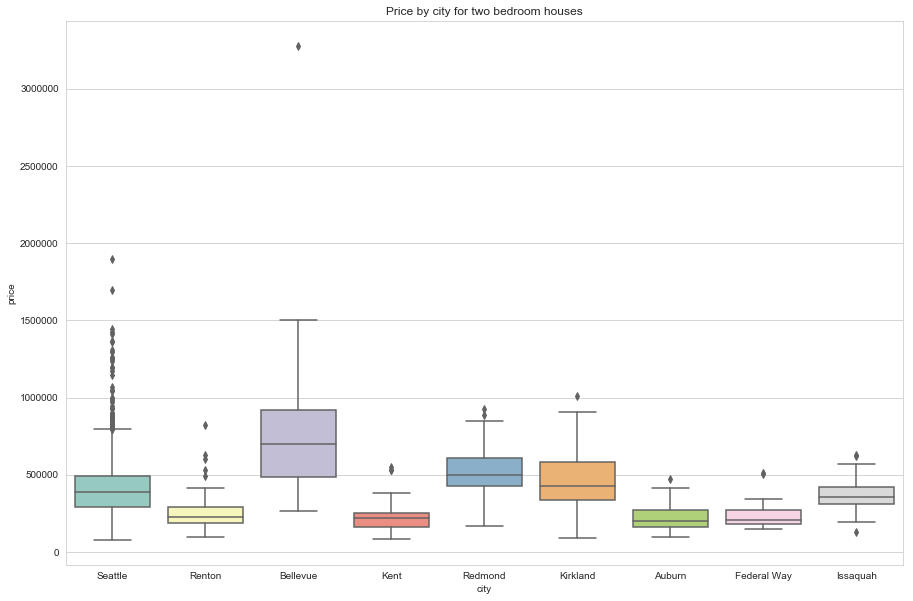

In [43]:
plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.boxplot(x="city", y="price", data=two, palette="Set3")
plt.title("Price by city for two bedroom houses")

Renton, Kent, Auburn, and Federal Way come out to have the cheapest 2-bedroom houses of the ten houses inspected, while Seattle, Bellevue, Redmond City, Kirkland, and Issaquah have more expensive 2-bedroom houses. Furthermore, Seattle contains a high number of outliers on the higher Price side.

Text(0.5, 1.0, 'Price by city for three bedroom houses')

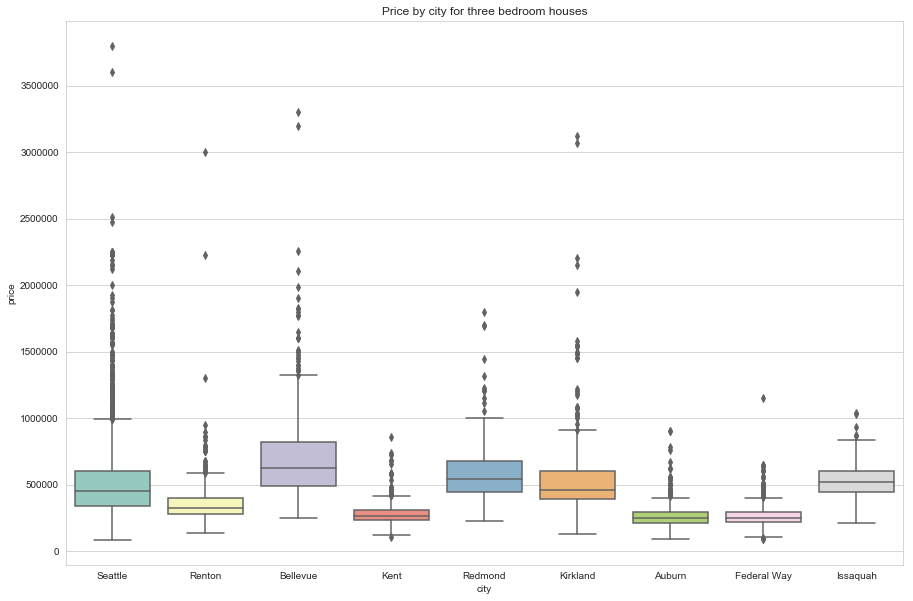

In [44]:
plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.boxplot(x="city", y="price", data=three, palette="Set3")
plt.title("Price by city for three bedroom houses")

We see the same pattern as above. Renton, Kent, Auburn, and Federal Way come out to have the cheapest 3-bedroom houses of the ten houses inspected, while Seattle, Bellevue, Redmond City, Kirkland, and Issaquah have more expensive 3-bedroom houses. The difference we see is an increase outliers in all the cities. This can simply be due to there being a lot more 3-bedroom houses than 2-bedroom houses in the dataset.

Text(0.5, 1.0, 'Price by city for four bedroom houses')

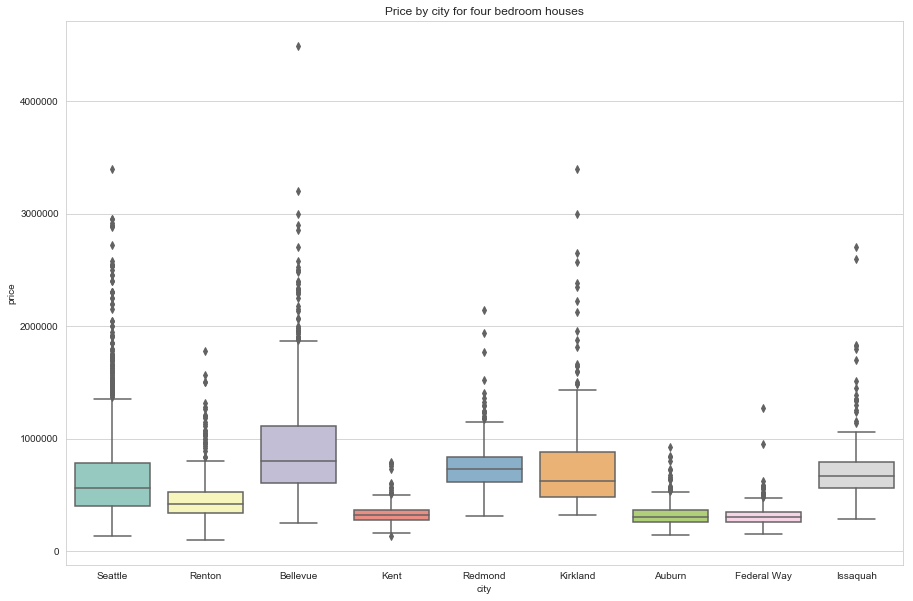

In [45]:
plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.boxplot(x="city", y="price", data=four, palette="Set3")
plt.title("Price by city for four bedroom houses")

Again, Renton, Kent, Auburn, and Federal Way come out to have the cheapest 4-bedroom houses of the ten houses inspected, while Seattle, Bellevue, Redmond City, Kirkland, and Issaquah have more expensive 4-bedroom houses. 

## Modeling the Data - Predicting House Sale Prices

In [46]:
x = kc[['bedrooms','bathrooms','sqft_living','sqft_lot','floors','waterfront','view',
'condition','grade','sqft_above','sqft_basement','yr_built','zipcode','lat','long']]
y = kc['price']

In [47]:
x1 = x.copy()
y1 = y.copy()

In [48]:
sub_data = pd.DataFrame(x1)
sub_data['price'] = y1
sub_data.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,price
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,98178,47.5112,-122.257,221900.0
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,98125,47.7210,-122.319,538000.0
2,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,98028,47.7379,-122.233,180000.0
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,98136,47.5208,-122.393,604000.0
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,98074,47.6168,-122.045,510000.0


### 10% for test dataset is randomly selected.
We split our data into two sets: 90% as training set, and 10% as our validation set.

In [51]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=104951689)

### Multiple linear regression

We will now try to predict houses sale prices using this finalized data set. First we will use multiple linear regression.


In [52]:
sub_data.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,price
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,98178,47.5112,-122.257,221900.0
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,98125,47.7210,-122.319,538000.0
2,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,98028,47.7379,-122.233,180000.0
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,98136,47.5208,-122.393,604000.0
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,98074,47.6168,-122.045,510000.0


In [70]:
regression = linear_model.LinearRegression()
regression.fit(x_train,y_train)
print("Training R^2: ", round(regression.score(x_train,y_train)*100,2), "%")
regression.coef_

Training R^2:  69.79 %


array([-3.48464044e+04,  4.31358358e+04,  1.13008750e+02, -3.97100239e-02,
        4.63953599e+03,  6.13819186e+05,  5.39564772e+04,  2.38405207e+04,
        1.01275286e+05,  7.35752710e+01,  3.94334790e+01, -2.72774364e+03,
       -6.13649516e+02,  6.02436780e+05, -2.09685809e+05])

In [67]:
predict_0 = regression.predict([[3,1,1180,5650,1,0,0,3,7,1180,0,1955,98178,47.5112,-122.257]])
predict_1 = regression.predict([[3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,98125,47.7210,-122.319]])
predict_2 = regression.predict([[2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,98028,47.7379,-122.233]])
predict_3 = regression.predict([[4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,98136,47.5208,-122.393]])
predict_4 = regression.predict([[3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,98074,47.6168,-122.045]])
print("1st(act vs pred)->", "actual:", y.loc[0], ", predicted: ", predict_0, round(min([float(predict_0),y.loc[0]])/max([float(predict_0),y.loc[0]])*100, 2), "%")
print("2nd(act vs pred)->", "actual:", y.loc[1], ", predicted: ", predict_1, round(min([float(predict_1),y.loc[1]])/max([float(predict_1),y.loc[1]])*100, 2), "%")
print("3rd(act vs pred)->", "actual:", y.loc[2], ", predicted: ", predict_2, round(min([float(predict_2),y.loc[2]])/max([float(predict_2),y.loc[2]])*100, 2), "%")
print("4th(act vs pred)->", "actual:", y.loc[3], ", predicted: ", predict_3, round(min([float(predict_3),y.loc[3]])/max([float(predict_3),y.loc[3]])*100, 2), "%")
print("5th(act vs pred)->", "actual:", y.loc[4], ", predicted: ", predict_4, round(min([float(predict_4),y.loc[4]])/max([float(predict_4),y.loc[4]])*100, 2), "%")

1st(act vs pred)-> actual: 221900.0 , predicted:  [213240.29550618] 96.1 %
2nd(act vs pred)-> actual: 538000.0 , predicted:  [700257.63587881] 76.83 %
3rd(act vs pred)-> actual: 180000.0 , predicted:  [353736.97284662] 50.89 %
4th(act vs pred)-> actual: 604000.0 , predicted:  [459635.42781654] 76.1 %
5th(act vs pred)-> actual: 510000.0 , predicted:  [446542.61777483] 87.56 %


In [80]:
y_test_predict = regression.predict(x_test)
print("Testing R^2: ", round(regression.score(x_test,y_test)*100,2), "%")
print("RMSE: ", round(np.sqrt(sm.mean_squared_error(y_test, y_test_predict)), 2))

Testing R^2:  70.37 %
RMSE:  202540.39


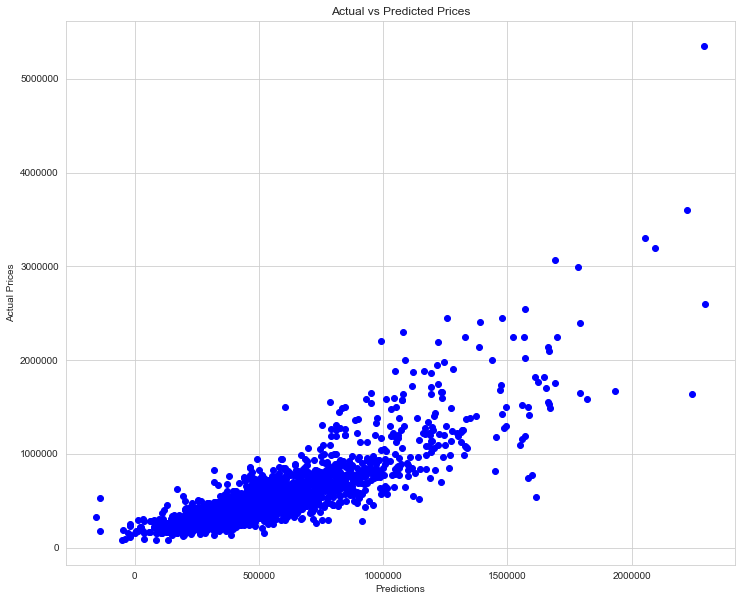

In [72]:
plt.subplots(figsize=(12, 10))
plt.plot(y_test_predict, y_test, 'bo')
plt.xlabel('Predictions')
plt.ylabel('Actual Prices')
plt.title("Actual vs Predicted Prices")
plt.show()

Our training R-squared value comes out to 69.79%, while our testing R-squared value comes out to 70.37%. Furthermore, our Root-MSE for the testing set comes out to 202540.39.

Judging by these results and the plot of our predictions versus observed values in the testing set above, Multiple Linear Regression does a solid job in prediction House Sale Prices. We verify our results by performing Cross Validation below, and then move on to try another Regression method (Gradient Boosting Regression) in hopes to achieve better predictions.

### Cross Validation

In [79]:
predictors = sub_data.drop('price', axis =1)
response = sub_data.price

cv =  cross_val_score(regression, predictors, response, cv = 20)

print(cv)

print("The average CV Score is: ", cv.mean())

[0.70293202 0.68794137 0.73299324 0.67032099 0.66722241 0.70845962
 0.69676277 0.68432952 0.65947918 0.70238899 0.72473127 0.67658105
 0.69318284 0.72676764 0.70637582 0.70665985 0.70519692 0.69064565
 0.69468116 0.68856017]
The average CV Score is:  0.6963106236587713


### Gradient Boosting Regression

Now we attempt a Gradient Boost regression to compare with multiple Linear regression

In [88]:
clf = ensemble.GradientBoostingRegressor(n_estimators = 500, max_depth = 5, min_samples_split = 2, learning_rate = 0.1, loss = 'ls')
clf.fit(x_train,y_train)
y_test_predict2 = clf.predict(x_test)
print("Training R^2: ", round(clf.score(x_train,y_train)*100, 2))

Training R^2:  97.27


In [89]:
predict_0_2 = clf.predict([[3,1,1180,5650,1,0,0,3,7,1180,0,1955,98178,47.5112,-122.257]])
predict_1_2 = clf.predict([[3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,98125,47.7210,-122.319]])
predict_2_2 = clf.predict([[2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,98028,47.7379,-122.233]])
predict_3_2 = clf.predict([[4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,98136,47.5208,-122.393]])
predict_4_2 = clf.predict([[3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,98074,47.6168,-122.045]])
print("1st(act vs pred)->", "actual:", y.loc[0], ", predicted: ", predict_0_2, round(float(predict_0_2)), "accur: ", round(min([float(predict_0_2),y.loc[0]])/max([float(predict_0_2),y.loc[0]])*100, 2), "%")
print("2st(act vs pred)->", "actual:", y.loc[1], ", predicted: ", predict_1_2, round(float(predict_1_2)), "accur: ", round(min([float(predict_1_2),y.loc[1]])/max([float(predict_1_2),y.loc[1]])*100, 2), "%")
print("3st(act vs pred)->", "actual:", y.loc[2], ", predicted: ", predict_2_2, round(float(predict_2_2)), "accur: ", round(min([float(predict_2_2),y.loc[2]])/max([float(predict_2_2),y.loc[2]])*100, 2), "%")
print("4st(act vs pred)->", "actual:", y.loc[3], ", predicted: ", predict_3_2, round(float(predict_3_2)), "accur: ", round(min([float(predict_3_2),y.loc[3]])/max([float(predict_3_2),y.loc[3]])*100, 2), "%")
print("5th(act vs pred)->", "actual:", y.loc[4], ", predicted: ", predict_4_2, round(float(predict_4_2)), "accur: ", round(min([float(predict_4_2),y.loc[4]])/max([float(predict_4_2),y.loc[4]])*100, 2), "%")

1st(act vs pred)-> actual: 221900.0 , predicted:  [224574.19801831] 224574 accur:  98.81 %
2st(act vs pred)-> actual: 538000.0 , predicted:  [490567.29593962] 490567 accur:  91.18 %
3st(act vs pred)-> actual: 180000.0 , predicted:  [255921.85739391] 255922 accur:  70.33 %
4st(act vs pred)-> actual: 604000.0 , predicted:  [517315.51330026] 517316 accur:  85.65 %
5th(act vs pred)-> actual: 510000.0 , predicted:  [485891.42305181] 485891 accur:  95.27 %


In [90]:
print("Testing R^2: ", round(clf.score(x_test,y_test)*100, 2))
print("RMSE: ", round(np.sqrt(sm.mean_squared_error(y_test, y_test_predict2)), 2))

Testing R^2:  90.68
RMSE:  113560.17


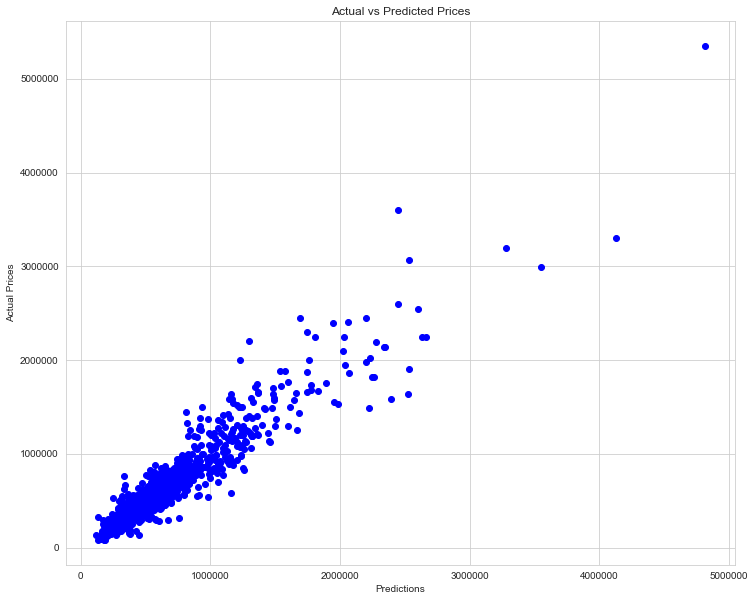

In [91]:
plt.subplots(figsize=(12, 10))
plt.plot(y_test_predict2, y_test, 'bo')
plt.xlabel('Predictions')
plt.ylabel('Actual Prices')
plt.title("Actual vs Predicted Prices")
plt.show()

Training R-squared and Testing R-squared values improve drastically, while Testing Root MSE decreases significantly from Multiple Linear Regression. Therefore, Gradient Boosting Regression methods significantly outperforms Multiple Linear Regression and gives us much more accurate predictions. 

There is a significant difference between the Training and Testing R-squared values. Thus, cross-validation is required.

In [93]:
cv_gradient = cross_val_score(clf, predictors, response, cv = 20)

print(cv_gradient)

print("The average CV Score is: ", cv_gradient.mean())

[0.90497968 0.88338531 0.90085435 0.8967251  0.90404991 0.89458421
 0.90121997 0.87088293 0.91249086 0.90333484 0.90642023 0.80692685
 0.87506433 0.84566163 0.915404   0.92073521 0.87585092 0.90864356
 0.90271759 0.87386932]
The average CV Score is:  0.8901900410463854


Performing a 20-fold cross-validation using Gradent Boosting Regression method gives us an average R-squared value of 0.89. This proves that Gradient Boosting performs better than Multiple Linear Regression.

### Conclusion

For Multiple Linear regression, our average R squared value came out to 69.30%, while our Gradient Boosting regression model produced an average R squared value of 89.02%. Therefore Gradient Boosting significiantly outperformed multiple linear regression.

### Limitations 

This dataset looks at houses sold in 2014 and 2015. Therefore our dataset is outdated and it will be benefical to look at the current housing market. Further more it will be helpful to have more variables in the dataset, such as garage, kitchen quality, pool, crime rate in area, etc.